# Introduction to Visualization in python

[Peer Herholz (he/him)](https://peerherholz.github.io/)  
Postdoctoral researcher - [NeuroDataScience lab](https://neurodatascience.github.io/) at [MNI](https://www.mcgill.ca/neuro/)/[McGill](https://www.mcgill.ca/), [UNIQUE](https://sites.google.com/view/unique-neuro-ai)  
Member - [BIDS](https://bids-specification.readthedocs.io/en/stable/), [ReproNim](https://www.repronim.org/), [Brainhack](https://brainhack.org/), [Neuromod](https://www.cneuromod.ca/), [OHBM SEA-SIG](https://ohbm-environment.org/) 

<img align="left" src="https://raw.githubusercontent.com/G0RELLA/gorella_mwn/master/lecture/static/Twitter%20social%20icons%20-%20circle%20-%20blue.png" alt="logo" title="Twitter" width="32" height="20" /> <img align="left" src="https://raw.githubusercontent.com/G0RELLA/gorella_mwn/master/lecture/static/GitHub-Mark-120px-plus.png" alt="logo" title="Github" width="30" height="20" />   &nbsp;&nbsp;@peerherholz 



- Python provides a wide array of options
- Low-level and high-level plotting APIs
- Static images vs. HTML output vs. interactive plots
- Domain-general and domain-specific packages

**PS: Many pieces of this notebook have been scavenged from other visualization notebooks and galleries. But the main things are from Tal Yarkoni's [visualization-in-python notebook](https://github.com/neurohackweek/visualization-in-python).**

# General Overview

In this notebook, we will cover the following python packages. Some of them are exclusively for visualization while others like `Pandas` have many other purposes:

- [Matplotlib](https://matplotlib.org/)
- [Seaborn](http://seaborn.pydata.org/)
- [Pandas](http://pandas.pydata.org/)
- [Bokeh](https://bokeh.pydata.org)
- [Plotly](https://plot.ly/python/)
- [HoloViews](http://holoviews.org/)

The visualization of the first three is all based on matplotlib and use static images. While the last three create HTML outputs and allow much more interactive plots. We will talk about each one as we go along.

## Python-graph-gallery
Check out the very helpful and cool new homepage https://python-graph-gallery.com/ to see how you can create different kinds of graphs.

## Preparation

As with most things in Python, we first load the relevant packages. Here we load three important packages:

In [5]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

The first line in the cell above is specific to Jupyter notebooks. It tells the interpreter to capture figures and embed them in the browser. Otherwise, they would end up almost in digital ether.

## The Datasets

For example purposes, we will make use of phenotypic information within a dataset from [OpenNeuro](https://openneuro.org/datasets/ds000228/versions/1.0.0), provided as part of the following publication:

[Hilary Richardson, Grace Lisandrelli, Alexa Riobueno-Naylor, and Rebecca Saxe. Development of the social brain from age three to twelve years. Nature communications, 9(1):1–12, 2018.](https://www.nature.com/articles/s41467-018-03399-2).

It contains age, age group, groups, gender and handedness for 150 participants, including children and adults.

We will use `curl` to gather the respective file:

In [2]:
%%bash
curl --silent --output /dev/null -O participants.tsv https://openneuro.org/crn/datasets/ds000228/snapshots/1.0.0/files/participants.tsv

Now we can load the dataframe using `pandas`:


In [8]:
sub_df = pd.read_table("participants.tsv")

and explore it:

In [9]:
sub_df

,participant_id,Age,AgeGroup,Child_Adult,Gender,Handedness,ToM Booklet-Matched,ToM Booklet-Matched-NOFB,FB_Composite,FB_Group,WPPSI BD raw,WPPSI BD scaled,KBIT_raw,KBIT_standard,DCCS Summary,Scanlog: Scanner,Scanlog: Coil,Scanlog: Voxel slize,Scanlog: Slice Gap
0,sub-pixar001,4.774812,4yo,child,M,R,0.80,0.736842,6.0,pass,22.0,13.0,NaN,NaN,3.0,3T1,7-8yo 32ch,3mm iso,0.1
1,sub-pixar002,4.856947,4yo,child,F,R,0.72,0.736842,4.0,inc,18.0,9.0,NaN,NaN,2.0,3T1,7-8yo 32ch,3mm iso,0.1
2,sub-pixar003,4.153320,4yo,child,F,R,0.44,0.421053,3.0,inc,15.0,9.0,NaN,NaN,3.0,3T1,7-8yo 32ch,3mm iso,0.1
3,sub-pixar004,4.473648,4yo,child,F,R,0.64,0.736842,2.0,fail,17.0,10.0,NaN,NaN,3.0,3T1,7-8yo 32ch,3mm iso,0.2
4,sub-pixar005,4.837782,4yo,child,F,R,0.60,0.578947,4.0,inc,13.0,5.0,NaN,NaN,2.0,3T1,7-8yo 32ch,3mm iso,0.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150,sub-pixar151,23.000000,Adult,adult,F,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3T1,32ch adult,3.13 mm iso,0.1
151,sub-pixar152,21.000000,Adult,adult,F,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3T1,32ch adult,3.13 mm iso,0.1
152,sub-pixar153,30.000000,Adult,adult,M,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3T1,32ch adult,3.13 mm iso,0.1
153,sub-pixar154,29.000000,Adult,adult,M,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3T1,32ch adult,3.13 mm iso,0.1


In the following cell we remove all participants that have missing values.

In [5]:
sub_df = sub_df.dropna(axis=1, how='all')
sub_df.head()

,participant_id,Age,AgeGroup,Child_Adult,Gender,Handedness,ToM Booklet-Matched,ToM Booklet-Matched-NOFB,FB_Composite,FB_Group,WPPSI BD raw,WPPSI BD scaled,KBIT_raw,KBIT_standard,DCCS Summary,Scanlog: Scanner,Scanlog: Coil,Scanlog: Voxel slize,Scanlog: Slice Gap
0,sub-pixar001,4.774812,4yo,child,M,R,0.80,0.736842,6.0,pass,22.0,13.0,NaN,NaN,3.0,3T1,7-8yo 32ch,3mm iso,0.1
1,sub-pixar002,4.856947,4yo,child,F,R,0.72,0.736842,4.0,inc,18.0,9.0,NaN,NaN,2.0,3T1,7-8yo 32ch,3mm iso,0.1
2,sub-pixar003,4.153320,4yo,child,F,R,0.44,0.421053,3.0,inc,15.0,9.0,NaN,NaN,3.0,3T1,7-8yo 32ch,3mm iso,0.1
3,sub-pixar004,4.473648,4yo,child,F,R,0.64,0.736842,2.0,fail,17.0,10.0,NaN,NaN,3.0,3T1,7-8yo 32ch,3mm iso,0.2
4,sub-pixar005,4.837782,4yo,child,F,R,0.60,0.578947,4.0,inc,13.0,5.0,NaN,NaN,2.0,3T1,7-8yo 32ch,3mm iso,0.2


Using the `keys` method we can look at all the column headings that are left.

In [6]:
list(sub_df.keys())

['participant_id',
 'Age',
 'AgeGroup',
 'Child_Adult',
 'Gender',
 'Handedness',
 'ToM Booklet-Matched',
 'ToM Booklet-Matched-NOFB',
 'FB_Composite',
 'FB_Group',
 'WPPSI BD raw',
 'WPPSI BD scaled',
 'KBIT_raw',
 'KBIT_standard',
 'DCCS Summary',
 'Scanlog: Scanner',
 'Scanlog: Coil',
 'Scanlog: Voxel slize',
 'Scanlog: Slice Gap']

Lets now see how we can visualize the information in this dataset (`sub_df`). Python has quite a lot of visualization packages. Undeniably, the most famous and at the same time versatile, that additionally is the basis of most others, is [matplotlib](https://matplotlib.org/). 

# `matplotlib`
* The most widely-used Python plotting library
* Initially modeled on MATLAB's plotting system
* Designed to provide complete control over a plot

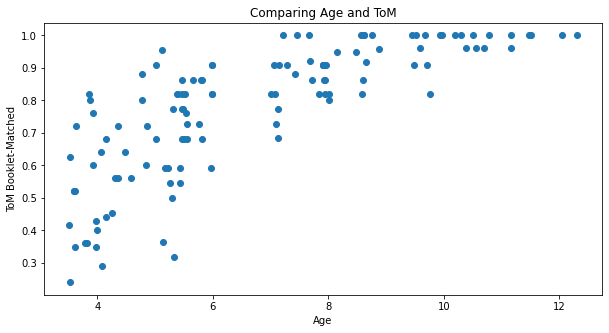

In [7]:
plt.figure(figsize=(10, 5))
plt.scatter(sub_df['Age'], sub_df['ToM Booklet-Matched'])
plt.xlabel('Age')
plt.ylabel('ToM Booklet-Matched')
plt.title('Comparing Age and ToM');

Thinking about how plotting works with `matplotlib`, we can explore a different approach to plotting, where we at first generate our figure and access certain parts of it, in order to modify them:

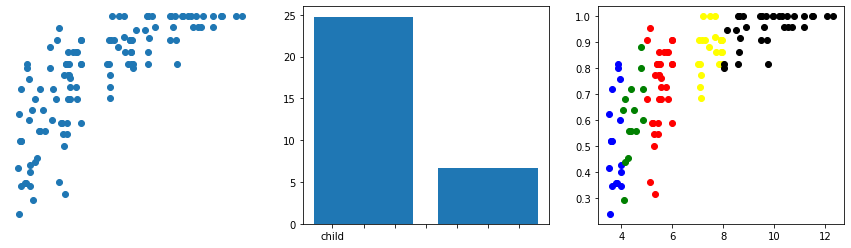

In [8]:
# Set up a figure with 3 columns
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# Scatter plot in top left
axes[0].scatter(sub_df['Age'], sub_df['ToM Booklet-Matched'])
axes[0].axis('off')

means = sub_df.groupby('Child_Adult')['Age'].mean()
axes[1].bar(np.arange(len(means))+1, means)

# Note how **broken** this is without additional code
axes[1].set_xticklabels(means.index)

colors = ['blue', 'green', 'red', 'yellow', 'black', 'violet']
for i, (s, grp) in enumerate(sub_df.groupby('AgeGroup')):
    axes[2].scatter(grp['Age'], grp['ToM Booklet-Matched'], c=colors[i])

## Exercise 1

Create a figure with a single axes and plot `Handedness` as function of `Child_Adult`. 
- Set the figure size to a ratio of 8 (wide) x 5 (height)
- Use the colors `red` and `gray`
- Set the opacity of the points to 0.5
- Label the axes
- Add a legend

```{admonition} Click the button to show the solution!
:class: dropdown

    plt.figure(figsize=(10, 5))
    colors = ['black', 'red']
    for i, (s, grp) in enumerate(sub_df.groupby('Child_Adult')):
        plt.scatter(grp['Age'], grp['Handedness'], c=colors[i], alpha=0.5)
    plt.xlabel('Age')
    plt.xlabel('Handedness')
    plt.legend(['Child', 'Adult']);

```

In [ ]:
# Create solution here

## From the Gallery

You can reuse code directly from the [matplotlib gallery](https://matplotlib.org/gallery/index.html).

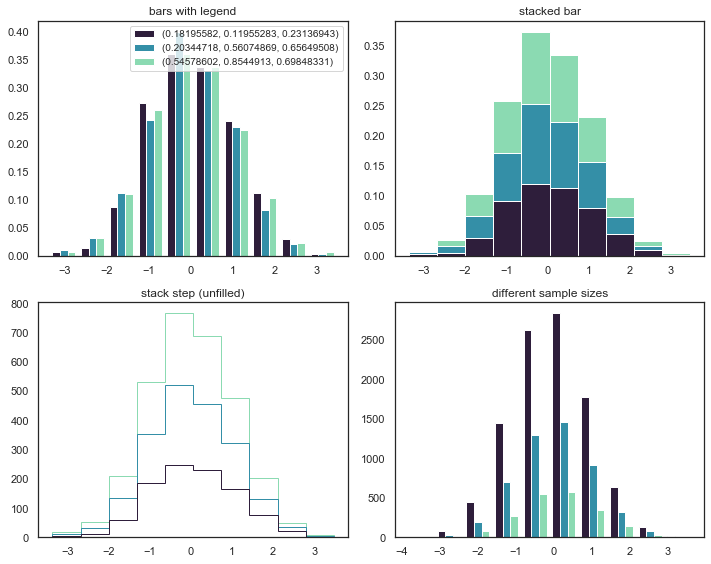

In [45]:
# Adapted from https://matplotlib.org/gallery/statistics/histogram_multihist.html

import numpy as np
import matplotlib.pyplot as plt

n_bins = 10
x = np.random.randn(1000, 3)

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 8))
ax0, ax1, ax2, ax3 = axes.flatten()

colors = [sns.color_palette("mako")[0], sns.color_palette("mako")[3], sns.color_palette("mako")[5]]
ax0.hist(x, n_bins, normed=1, histtype='bar', color=colors, label=colors)
ax0.legend(prop={'size': 10})
ax0.set_title('bars with legend')

ax1.hist(x, n_bins, normed=1, histtype='bar', stacked=True, color=colors)
ax1.set_title('stacked bar')

ax2.hist(x, n_bins, histtype='step', stacked=True, fill=False, color=colors)
ax2.set_title('stack step (unfilled)')

# Make a multiple-histogram of data-sets with different length.
x_multi = [np.random.randn(n) for n in [10000, 5000, 2000]]
ax3.hist(x_multi, n_bins, histtype='bar', color=colors)
ax3.set_title('different sample sizes')

fig.tight_layout()
plt.show()

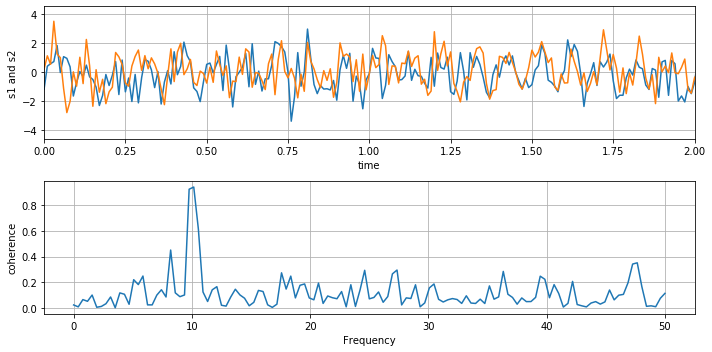

In [21]:
# Adapted from https://matplotlib.org/gallery/lines_bars_and_markers/cohere.html

import numpy as np
import matplotlib.pyplot as plt

dt = 0.01
t = np.arange(0, 30, dt)
nse1 = np.random.randn(len(t))  # white noise 1
nse2 = np.random.randn(len(t))  # white noise 2

# Two signals with a coherent part at 10Hz and a random part
s1 = np.sin(2 * np.pi * 10 * t) + nse1
s2 = np.sin(2 * np.pi * 10 * t) + nse2

fig, axs = plt.subplots(2, 1, figsize=(10, 5))
axs[0].plot(t, s1, t, s2)
axs[0].set_xlim(0, 2)
axs[0].set_xlabel('time')
axs[0].set_ylabel('s1 and s2')
axs[0].grid(True)

cxy, f = axs[1].cohere(s1, s2, 256, 1. / dt)
axs[1].set_ylabel('coherence')

fig.tight_layout()
plt.show()

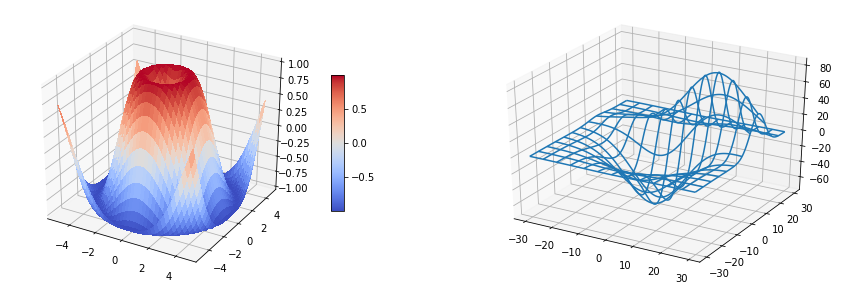

In [22]:
# Adapted from http://matplotlib.org/examples/mplot3d/subplot3d_demo.html

from mpl_toolkits.mplot3d.axes3d import Axes3D
import matplotlib.pyplot as plt

# imports specific to the plots in this example
import numpy as np
from matplotlib import cm
from mpl_toolkits.mplot3d.axes3d import get_test_data

# Twice as wide as it is tall.
fig = plt.figure(figsize=(15, 5))

#---- First subplot
ax = fig.add_subplot(1, 2, 1, projection='3d')
X = np.arange(-5, 5, 0.25)
Y = np.arange(-5, 5, 0.25)
X, Y = np.meshgrid(X, Y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)
surf = ax.plot_surface(X, Y, Z, rstride=1, cstride=1, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)
ax.set_zlim3d(-1.01, 1.01)

fig.colorbar(surf, shrink=0.5, aspect=10)

#---- Second subplot
ax = fig.add_subplot(1, 2, 2, projection='3d')
X, Y, Z = get_test_data(0.05)
ax.plot_wireframe(X, Y, Z, rstride=10, cstride=10);

## Customization in matplotlib

* matplotlib is infinitely customizable
* As in most modern plotting environments, you can do virtually anything
* You just have to be willing to spend enough time on it

## `matplotlib`

**Pros**
* Provides low-level control over virtually every element of a plot
* Completely object-oriented API; plot components can be easily modified
* Close integration with numpy
* Extremely active community
* Tons of functionality (figure compositing, layering, annotation, coordinate transformations, color mapping, etc.)

**Cons**
* Steep learning curve
* API is extremely unpredictable--redundancy and inconsistency are common
    * Some simple things are hard; some complex things are easy
* Lacks systematicity/organizing syntax--every plot is its own little world
* Simple plots often require a lot of code
* Default styles are kind of ugly
* The documentation... *why*?

# High-level interfaces to matplotlib
* Matplotlib is very powerful and very robust, but the API is hit-and-miss
* Many high-level interfaces to matplotlib have been written
    * Abstract away many of the annoying details
    * The best of both worlds: easy generation of plots, but retain `matplotlib`'s power
* [Seaborn](https://stanford.edu/~mwaskom/software/seaborn/index.html), [ggplot](http://ggplot.yhathq.com/), [pandas](https://pandas.pydata.org/), etc.
* Many domain-specific visualization tools are built on `matplotlib` (e.g., [nilearn](http://nilearn.github.io/plotting/index.html) in neuroimaging)

# `Pandas`
* Provides simple but powerful plotting tools
* DataFrame integration supports, e.g., groupby() calls for faceting
* Often the easiest approach for simple data exploration
* Arguably not as powerful, elegant, or intuitive as seaborn

Let's load an example dataset and have a brief look at it:

In [46]:
import pandas as pd
iris = sns.load_dataset("iris")

In [47]:
iris[::8]

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
8,4.4,2.9,1.4,0.2,setosa
16,5.4,3.9,1.3,0.4,setosa
24,4.8,3.4,1.9,0.2,setosa
32,5.2,4.1,1.5,0.1,setosa
40,5.0,3.5,1.3,0.3,setosa
48,5.3,3.7,1.5,0.2,setosa
56,6.3,3.3,4.7,1.6,versicolor
64,5.6,2.9,3.6,1.3,versicolor
72,6.3,2.5,4.9,1.5,versicolor


As we can see, there are 4 different variables containing ordinal data. One thing, we can for example easily do is to plot their distribution using a [KDE](https://en.wikipedia.org/wiki/Kernel_density_estimation). For now, we will collapse over the `species` variable. 

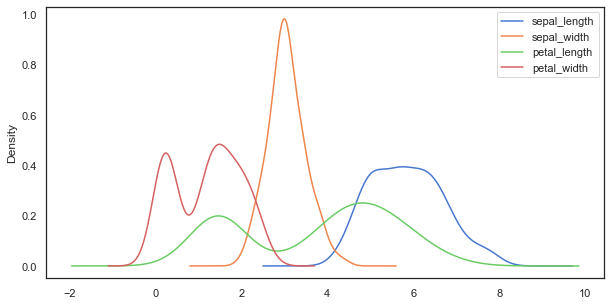

In [48]:
iris.plot(kind='kde', figsize=(10, 5));

If we now want to have a closer, more specific look at the different `species`, we can for example employ [boxplots](https://en.wikipedia.org/wiki/Box_plot):

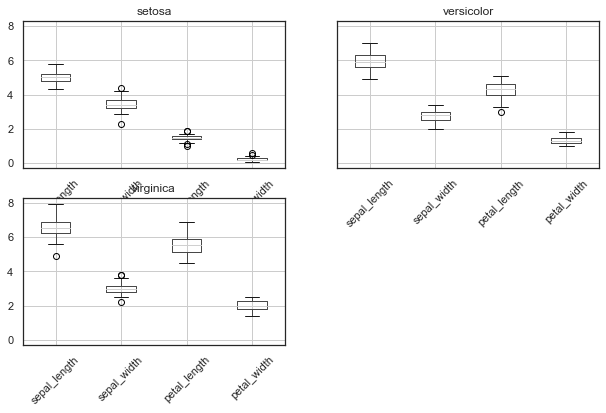

In [49]:
iris.groupby('species').boxplot(rot=45, figsize=(10,6));

However, always think about the [potential problems with boxplots](https://thestatsninja.com/tag/boxplot/):

![boxplot gif](https://annalloyd.files.wordpress.com/2019/02/boxplots.gif)

Source: Autodesk Research via [https://thestatsninja.com/tag/boxplot/](https://thestatsninja.com/tag/boxplot/)

# `Seaborn`

[Seaborn](seaborn.pydata.org) abstracts away many of the complexities to deal with such minutiae and provides a high-level API for creating aesthetic plots. 

* Arguably the premier matplotlib interface for high-level plots
* Generates beautiful plots in very little code
    * Beautiful styles and color palettes
* Wide range of supported plots
* Modest support for structured plotting (via grids)
* Exceptional [documentation](https://stanford.edu/~mwaskom/software/seaborn/index.html)
* Generally, the best place to start when exploring data
* Can be quite slow (e.g., with permutation)

For example, the following command auto adjusts the setting for the figure to reflect what you are using the figure for.

In [50]:
import seaborn as sns

In [51]:
# Adjust the context of the plot
sns.set_context('poster') # http://seaborn.pydata.org/tutorial/aesthetics.html#scaling-plot-elements
sns.set_palette('pastel') # http://seaborn.pydata.org/tutorial/color_palettes.html

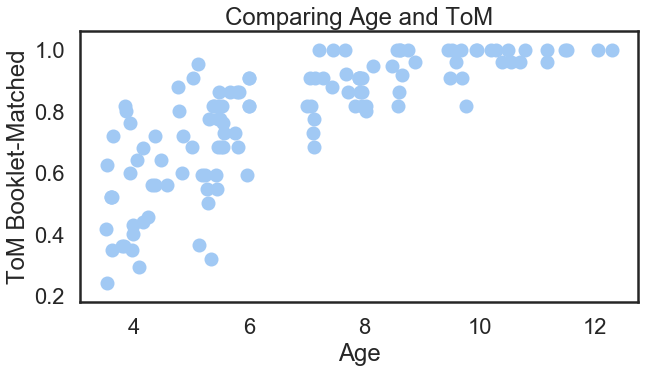

In [53]:
# But still use matplotlib to do the plotting
plt.figure(figsize=(10, 5))
plt.scatter(sub_df['Age'], sub_df['ToM Booklet-Matched'])
plt.xlabel('Age')
plt.ylabel('ToM Booklet-Matched')
plt.title('Comparing Age and ToM');

In [54]:
# Adjust the context of the plot
sns.set_context('paper')
sns.set_palette('colorblind')

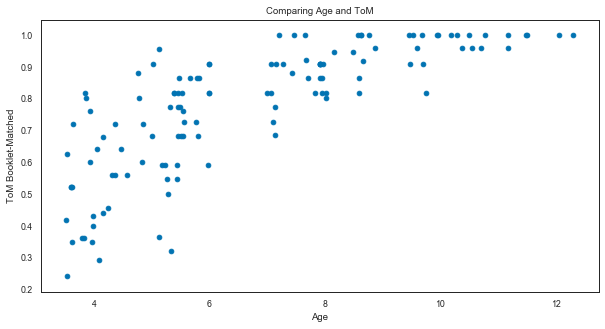

In [55]:
# But still use matplotlib to do the plotting
plt.figure(figsize=(10, 5))
plt.scatter(sub_df['Age'], sub_df['ToM Booklet-Matched'])
plt.xlabel('Age')
plt.ylabel('ToM Booklet-Matched')
plt.title('Comparing Age and ToM');

Now let's redo the scatter plot in seaborn style.

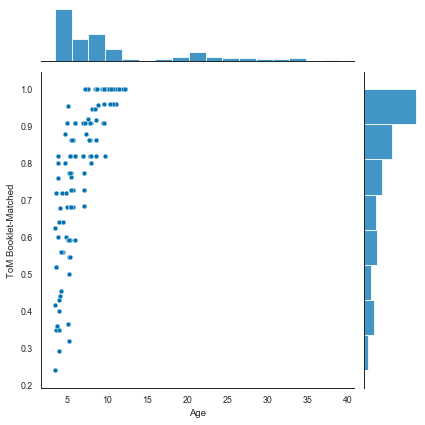

In [56]:
sns.jointplot(x='Age', y='ToM Booklet-Matched', data=sub_df);

## `Seaborn` example

Given the dataset we are using, what would you change to provide a better understanding of the data.

One way to do this with seaborn is to use a more general interface called the [FacetGrid](https://seaborn.pydata.org/generated/seaborn.FacetGrid.html#seaborn.FacetGrid).

Let's replot the figure while learning about a few new commands. Try to understand what the function does and try to change some parameters.

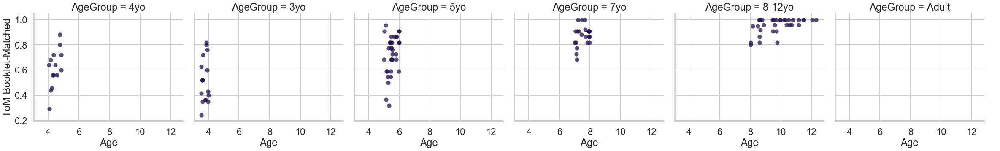

In [58]:
sns.set(style="whitegrid", palette="magma", color_codes=True)
sns.set_context('poster')

kws = dict(s=100, alpha=0.75, linewidth=0.15, edgecolor="k")

g = sns.FacetGrid(sub_df, col="AgeGroup", palette="magma",
                  hue_order=[1, 2], size=5.5)
g = (g.map(plt.scatter, "Age", "ToM Booklet-Matched", **kws).add_legend())

With just a few lines of code, note how much control you have over the figure.

## Exercise 2

Using a [pairwise plot](http://seaborn.pydata.org/generated/seaborn.pairplot.html#seaborn.pairplot), compare the distributions of `Age`, `ToM Booklet-Matched`, and `WPPSI BD raw` with respect to `Child_Adult` (and ask yourself if it makes sense).

- Set a palette
- Set style to `ticks`
- Set context to `paper`
- Suppress the `dx_group` variable from being on the plot

```{admonition} Click the button to show the solution!
:class: dropdown

    sns.set_palette(palette='hls')
    sns.set_context('paper')
    sns.set_style('ticks')
    sns.pairplot(sub_df, vars=['Age', 'ToM Booklet-Matched', 'WPPSI BD raw'], 
                 hue="Child_Adult", size=3);
```

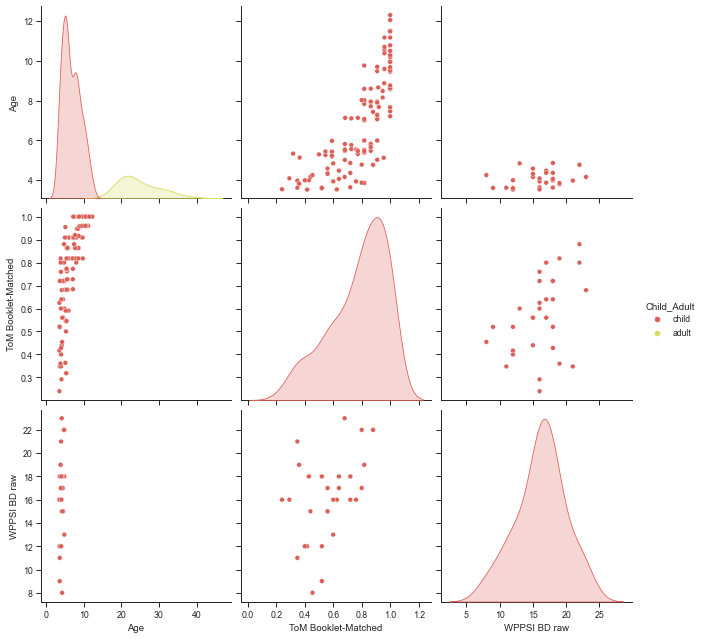

In [24]:
# Create solution here

## From the Gallery

You can reuse code directly from the [seaborn gallery](https://seaborn.pydata.org/examples/index.html).

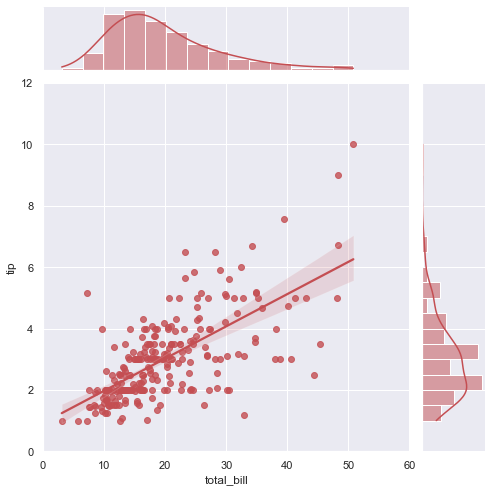

In [59]:
# Adapted from http://seaborn.pydata.org/examples/regression_marginals.html

import seaborn as sns
sns.set(style="darkgrid", color_codes=True)

tips = sns.load_dataset("tips")
g = sns.jointplot("total_bill", "tip", data=tips, kind="reg",
                  xlim=(0, 60), ylim=(0, 12), color="r", size=7)

   total_bill   tip     sex smoker  day    time  size
0       16.99  1.01  Female     No  Sun  Dinner     2
1       10.34  1.66    Male     No  Sun  Dinner     3
2       21.01  3.50    Male     No  Sun  Dinner     3
3       23.68  3.31    Male     No  Sun  Dinner     2
4       24.59  3.61  Female     No  Sun  Dinner     4


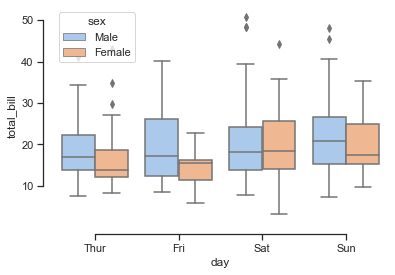

In [34]:
# Adapted from http://seaborn.pydata.org/examples/grouped_boxplot.html

import seaborn as sns
sns.set(style="ticks")

print(tips.head())

# Draw a nested boxplot to show bills by day and sex
sns.boxplot(x="day", y="total_bill", hue="sex", data=tips, palette="pastel")
sns.despine(offset=10, trim=True, )

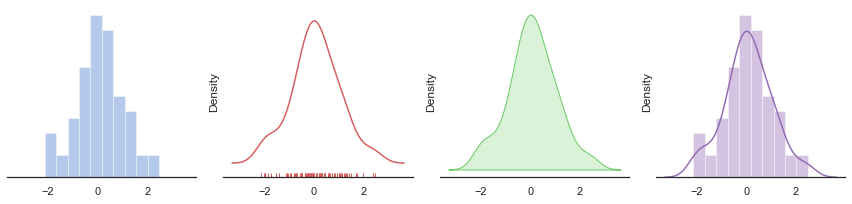

In [44]:
# Adapted from http://seaborn.pydata.org/examples/distplot_options.html

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(style="white", palette="muted", color_codes=True)
rs = np.random.RandomState(10)

# Set up the matplotlib figure
f, axes = plt.subplots(1, 4, figsize=(12, 3), sharex=True)
sns.despine(left=True)

# Generate a random univariate dataset
d = rs.normal(size=100)

# Plot a simple histogram with binsize determined automatically
sns.distplot(d, kde=False, color="b", ax=axes[0])

# Plot a kernel density estimate and rug plot
sns.distplot(d, hist=False, rug=True, color="r", ax=axes[1])

# Plot a filled kernel density estimate
sns.distplot(d, hist=False, color="g", kde_kws={"shade": True}, ax=axes[2])

# Plot a historgram and kernel density estimate
sns.distplot(d, color="m", ax=axes[3])

plt.setp(axes, yticks=[])
plt.tight_layout()

In [37]:
iris.head()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


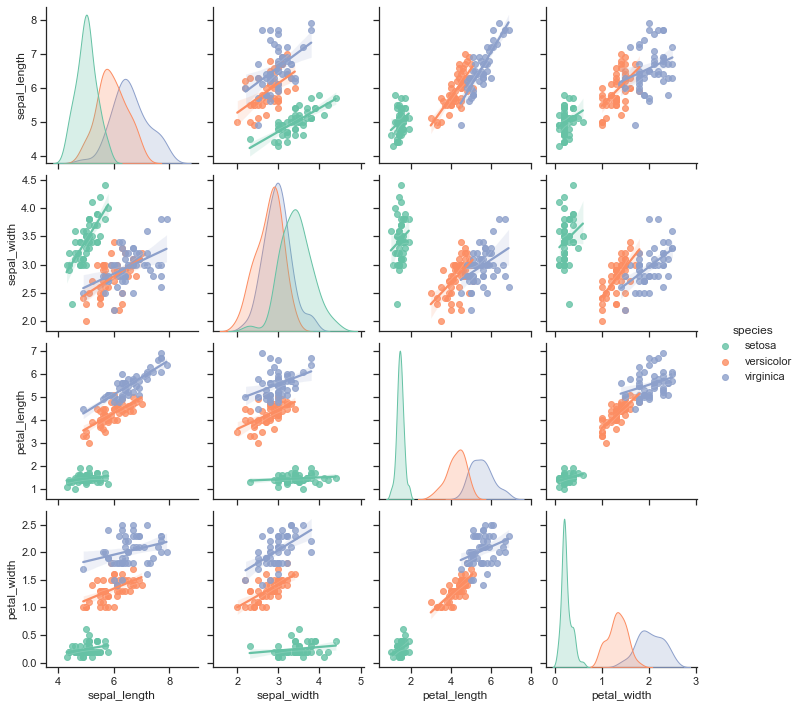

In [36]:
# Adapted from https://seaborn.pydata.org/tutorial/axis_grids.html

import seaborn as sns
sns.set(style="ticks")

g = sns.pairplot(iris, hue="species", palette="Set2", kind='reg',
                 diag_kind="kde", size=2.5)

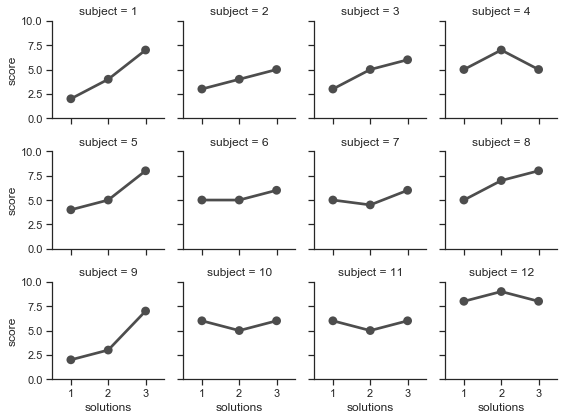

In [38]:
# Adapted from https://seaborn.pydata.org/tutorial/axis_grids.html

attend = sns.load_dataset('attention').query("subject <= 12")
g = sns.FacetGrid(attend, col="subject", col_wrap=4, size=2, ylim=(0, 10))
g.map(sns.pointplot, "solutions", "score", color=".3", ci=None);

# Alternatives to matplotlib
* You don't *have* to use `matplotlib`
* Some good reasons to use alternatives:
    * You want to output to HTML, SVG, etc.
    * You want something that plays well with other specs or isn't tied to Python
    * You hate matplotlib
* Good news! You have many options...
    * `bokeh`, `plotly`, `HoloViews`...

# `Bokeh`
* A Python visualization engine that outputs directly to the web
* Can render `matplotlib` plots to Bokeh, but not vice versa
* Lets you generate [interactive web-based visualizations](https://demo.bokehplots.com/apps/movies) in pure Python (!)
* You get interactivity for free, and can easily customize them
* Works seamlessly in Jupyter notebooks
* Package development is _incredibly_ fast
* Biggest drawback may be the inability to output static images

In [3]:
# Adapted from http://bokeh.pydata.org/en/latest/docs/gallery/iris.html

from bokeh.plotting import figure, show, output_notebook
from bokeh.sampledata.iris import flowers

output_notebook()

colormap = {'setosa': 'red', 'versicolor': 'green', 'virginica': 'blue'}
colors = [colormap[x] for x in flowers['species']]

p = figure(title = "Iris Morphology")
p.xaxis.axis_label = 'Petal Length'
p.yaxis.axis_label = 'Petal Width'

p.circle(flowers["petal_length"], flowers["petal_width"],
         color=colors, fill_alpha=0.2, size=10)

show(p)

Loading BokehJS ...

In [2]:
import numpy as np

from bokeh.plotting import figure, show, output_notebook
from bokeh.models import HoverTool, ColumnDataSource
from bokeh.sampledata.les_mis import data

output_notebook()

nodes = data['nodes']
names = [node['name'] for node in sorted(data['nodes'], key=lambda x: x['group'])]

N = len(nodes)
counts = np.zeros((N, N))
for link in data['links']:
    counts[link['source'], link['target']] = link['value']
    counts[link['target'], link['source']] = link['value']

colormap = ["#444444", "#a6cee3", "#1f78b4", "#b2df8a", "#33a02c", "#fb9a99",
            "#e31a1c", "#fdbf6f", "#ff7f00", "#cab2d6", "#6a3d9a"]

xname = []
yname = []
color = []
alpha = []
for i, node1 in enumerate(nodes):
    for j, node2 in enumerate(nodes):
        xname.append(node1['name'])
        yname.append(node2['name'])

        alpha.append(min(counts[i,j]/4.0, 0.9) + 0.1)

        if node1['group'] == node2['group']:
            color.append(colormap[node1['group']])
        else:
            color.append('lightgrey')

source = ColumnDataSource(data=dict(xname=xname, yname=yname, colors=color,
                                    alphas=alpha, count=counts.flatten()))

p = figure(title="Les Mis Occurrences",
           x_axis_location="above", tools="hover,save",
           x_range=list(reversed(names)), y_range=names)

p.plot_width = 800
p.plot_height = 800
p.grid.grid_line_color = None
p.axis.axis_line_color = None
p.axis.major_tick_line_color = None
p.axis.major_label_text_font_size = "5pt"
p.axis.major_label_standoff = 0
p.xaxis.major_label_orientation = np.pi/3

p.rect('xname', 'yname', 0.9, 0.9, source=source,
       color='colors', alpha='alphas', line_color=None,
       hover_line_color='black', hover_color='colors')

p.select_one(HoverTool).tooltips = [('names', '@yname, @xname'),
                                    ('count', '@count')]

show(p) # show the plot

Loading BokehJS ...

# `Plot.ly`
* [Plot.ly](https://plot.ly/python/) fills the same niche as Bokeh - web-based visualization via other languages
* Lets you build visualizations either in native code or online

In [8]:
# Adapted from https://plot.ly/python/ipython-notebook-tutorial/

import plotly
from plotly.offline import init_notebook_mode, plot
from IPython.core.display import display, HTML
import plotly.figure_factory as ff
from plotly.graph_objs import *

import pandas as pd

df = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/school_earnings.csv")

table = ff.create_table(df)

trace_women = Bar(x=df.School, y=df.Women, name='Women', marker=dict(color='#ffcdd2'))
trace_men = Bar(x=df.School, y=df.Men, name='Men', marker=dict(color='#A2D5F2'))
trace_gap = Bar(x=df.School, y=df.Gap, name='Gap', marker=dict(color='#59606D'))

data = [trace_women, trace_men, trace_gap]
layout = Layout(title="Average Earnings for Graduates",
                xaxis=dict(title='School'),
                yaxis=dict(title='Salary (in thousands)'))
fig = Figure(data=data, layout=layout)

init_notebook_mode(connected=True)

plot(fig, filename = 'average_earnings.html')

display(HTML('average_earnings.html'))

In [10]:
# Adapted from https://plot.ly/python/line-and-scatter/

import plotly
from plotly.offline import init_notebook_mode, plot
from IPython.core.display import display, HTML
import plotly.graph_objs as go

# Create random data with numpy
import numpy as np

N = 100
random_x = np.linspace(0, 1, N)
random_y0 = np.random.randn(N) + 5
random_y1 = np.random.randn(N)
random_y2 = np.random.randn(N) - 5

# Create traces
trace0 = go.Scatter(x=random_x, y=random_y0, mode='lines', name='lines')
trace1 = go.Scatter(x=random_x, y=random_y1, mode='lines+markers', name='lines+markers')
trace2 = go.Scatter(x=random_x, y=random_y2, mode='markers', name='markers')
data = [trace0, trace1, trace2]

init_notebook_mode(connected=True)

plot(data, filename = 'plotly_test.html')

display(HTML('plotly_test.html'))

In [12]:
# Adapted from https://plot.ly/python/continuous-error-bars/

import plotly
from plotly.offline import init_notebook_mode, plot
from IPython.core.display import display, HTML
import plotly.graph_objs as go
import pandas as pd

df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/wind_speed_laurel_nebraska.csv')

upper_bound = go.Scatter(
    name='Upper Bound', x=df['Time'], y=df['10 Min Sampled Avg'] + df['10 Min Std Dev'], mode='lines',
    marker=dict(color="#444444"), line=dict(width=0), fillcolor='rgba(68, 68, 68, 0.3)', fill='tonexty')

trace = go.Scatter(
    name='Measurement', x=df['Time'], y=df['10 Min Sampled Avg'], mode='lines',
    line=dict(color='rgb(31, 119, 180)'), fillcolor='rgba(68, 68, 68, 0.3)', fill='tonexty')

lower_bound = go.Scatter(
    name='Lower Bound', x=df['Time'], y=df['10 Min Sampled Avg']-df['10 Min Std Dev'],
    marker=dict(color="#444444"), line=dict(width=0), mode='lines')

# Trace order can be important with continuous error bars
data = [lower_bound, trace, upper_bound]

layout = go.Layout(yaxis=dict(title='Wind speed (m/s)'),
                   title='Continuous, variable value error bars.', showlegend = False)

init_notebook_mode(connected=True)

fig = go.Figure(data=data, layout=layout)

plot(fig, filename = 'plotly_test_2.html')

display(HTML('plotly_test_2.html'))

In [13]:
# Adapted from https://plot.ly/python/3d-surface-plots/

import plotly
from plotly.offline import init_notebook_mode, plot
from IPython.core.display import display, HTML
import plotly.graph_objs as go
import pandas as pd

# Read data from a csv
z_data = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/api_docs/mt_bruno_elevation.csv')

data = [go.Surface(z=z_data.to_numpy())]
layout = go.Layout(autosize=True, width=500, height=500, margin=dict(l=65, r=50, b=65, t=90))
fig = go.Figure(data=data, layout=layout)

init_notebook_mode(connected=True)

plot(fig, filename = 'plotly_test_3.html')

display(HTML('plotly_test_3.html'))

# `HoloViews`

[HoloViews](http://holoviews.org/) - I don't know it, but it looks pretty nice?

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
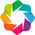

:GridMatrix   [X,Y]
   :NdOverlay   [species]
      :Scatter   [sepal_width]   (sepal_width)

In [14]:
# Adapted from http://holoviews.org/gallery/demos/bokeh/iris_splom_example.html#bokeh-gallery-iris-splom-example

import numpy as np
import holoviews as hv
hv.extension('bokeh')

# Declaring data 
from bokeh.sampledata.iris import flowers
from holoviews.operation import gridmatrix

ds = hv.Dataset(flowers)

grouped_by_species = ds.groupby('species', container_type=hv.NdOverlay)
grid = gridmatrix(grouped_by_species, diagonal_type=hv.Scatter)

# Plot 
plot_opts = dict(tools=['hover', 'box_select'], bgcolor='#efe8e2')
style = dict(fill_alpha=0.2, size=4)

grid({'Scatter': {'plot': plot_opts, 'style': style}})

# So... what should you use?
* I have no idea - there are too many options!
* Okay, some tentative recommendations:
    * Use seaborn for exploration (runners-up: pandas and ggplot)
    * Bokeh or plot.ly if you want to output interactive visualizations to the web
    * For everything else... matplotlib (still)
    * Keep an eye on others like HoloViews and Altair